In [1]:
begin
	quot(v)=v[1]//v[2]
	vect(r)=[numerator(r),denominator(r)]
end

vect (generic function with 1 method)

In [2]:
begin
	remainder(v)=v[1]%v[2]
	flr(v)=numerator(floor(v[1]//v[2]))
	newpair(v)=[v[2],remainder(v)]
	function continued_fraction(v)
		cf=[]
		while remainder(v)!=0
			push!(cf,flr(v))
			v=newpair(v)
		end
		push!(cf,flr(v))
		cf
	end
	function cf_value(cf)
		rev=reverse(cf)
		rat=popfirst!(rev)
		for j in rev
			rat=j+1//rat
		end
		[numerator(rat),denominator(rat)]
	end
end

cf_value (generic function with 1 method)

In [3]:
println(continued_fraction([3,10]))
println(cf_value([0,3,3]))

Any[0, 3, 3]
[3, 10]


In [4]:
println(cf_value([3,2,-4]))
println(cf_value([3,1,1,3]))

[25, 7]
[25, 7]


In [5]:
function center_corner_index(v)
	v[1]==1 && return [[0,1],[1,0],v[2]]
	center_cf=continued_fraction(v)[1:end-1]
	center=cf_value(center_cf)
	push!(center_cf,1)
	k2=cf_value(center_cf)
	corner=k2-center
	ind=numerator((v[1]-corner[1])//center[1])
	[center,corner,ind]
end

center_corner_index (generic function with 1 method)

In [6]:
print(center_corner_index([5,27]))

Any[[2, 11], [1, 5], 2]

In [7]:
using Polynomials

In [8]:
begin
	function dQ(v)
		return Polynomial(push!(zeros(Int64,v[2]), (-1)^v[1]))
	end
	function Q(v)
		v==[0,1] && return 1
		v==[1,0] && return 0
		v==[1,1] && return 1
		cci=center_corner_index(v)
		c,k,i=cci[1],cci[2],cci[3]
		return ([0 1; -dQ(c) Q(c)]^(i-1) * [Q(k); Q(k+c)])[2]
	end
end

Q (generic function with 1 method)

In [9]:
Q([3,10])

Polynomial(1 - 4*x + 5*x^2 - 3*x^4)

In [10]:
using PolynomialRoots

In [11]:
function bigroots(poly)
    PolynomialRoots.roots(convert(Vector{BigFloat},coeffs(poly)))
end

bigroots (generic function with 1 method)

In [12]:
print(bigroots(Q([3,10])))

Complex{BigFloat}[0.5 + 0.2886751345948128822545743902509787278238008756350634380093011632419888361514879im, 0.5 - 0.2886751345948128822545743902509787278238008756350634380093011632419888361514879im, -1.618033988749894848204586834365638117720309179805762862135448622705260462818892 + 0.0im, 0.6180339887498948482045868343656381177203091798057628621354486227052604628189098 + 0.0im]

In [13]:
begin
	function cleanpair(p)
    	r=p[1]//p[2]
    	return [numerator(r), denominator(r)]
	end
	function fractionline(n)  #fractions in (0,1/2) with denominator n.  
    	top=ceil(n//2)
    	L=[cleanpair([j,n]) for j in 1:top-1 ]
    	return filter(rat-> rat[2]==n ,L)
	end
end

fractionline (generic function with 1 method)

In [14]:
print(fractionline(10))

[[1, 10], [3, 10]]

In [15]:
RD=Dict([(D, Dict([(rat[1], [rat, -1]) for rat in fractionline(D)])) for D in 3:100]);

In [16]:
for den in keys(RD)
    for num in keys(RD[den])
        RD[den][num][2]=bigroots(Q([num,den]))
    end
end

In [17]:
function F64(z)
	return convert(Complex{Float64},z)
end

F64 (generic function with 1 method)

In [18]:
println(F64(RD[8][3][2][1]))
println(RD[8][3][2][1])

0.5 + 0.5im
0.5 + 0.5im


In [19]:
using DelimitedFiles

In [20]:
writedlm("roots", RD)

In [21]:
import Pkg
Pkg.add("Plots")

    Updating registry at `~/.julia/registries/General.toml`
   Resolving package versions...
   Installed LLVMExtra_jll ─ v0.0.13+3
  No Changes to `~/.julia/environments/v1.7/Project.toml`
    Updating `~/.julia/environments/v1.7/Manifest.toml`
  [dad2f222] ↑ LLVMExtra_jll v0.0.13+1 ⇒ v0.0.13+3
Precompiling project...
  ✓ LLVMExtra_jll
  ✓ LLVM
  ✓ GPUArrays
  ✓ GPUCompiler
  ✓ CUDA
  ✓ NNlibCUDA
  ✓ Flux
  7 dependencies successfully precompiled in 28 seconds (407 already precompiled)


In [22]:
using Plots

In [23]:
Pkg.add("CSV")

   Resolving package versions...
  No Changes to `~/.julia/environments/v1.7/Project.toml`
  No Changes to `~/.julia/environments/v1.7/Manifest.toml`


In [24]:
using CSV

In [25]:
Pkg.add("JLD")

   Resolving package versions...
   Installed HDF5_jll ── v1.12.1+0
   Installed Blosc_jll ─ v1.21.1+0
   Installed Lz4_jll ─── v1.9.3+0
   Installed Blosc ───── v0.7.3
   Installed JLD ─────── v0.13.1
   Installed H5Zblosc ── v0.1.0
   Installed HDF5 ────── v0.16.2
    Updating `~/.julia/environments/v1.7/Project.toml`
  [4138dd39] + JLD v0.13.1
    Updating `~/.julia/environments/v1.7/Manifest.toml`
  [a74b3585] + Blosc v0.7.3
  [c8ec2601] + H5Zblosc v0.1.0
  [f67ccb44] + HDF5 v0.16.2
  [4138dd39] + JLD v0.13.1
  [0b7ba130] + Blosc_jll v1.21.1+0
  [0234f1f7] + HDF5_jll v1.12.1+0
  [5ced341a] + Lz4_jll v1.9.3+0
    Building HDF5 → `~/.julia/scratchspaces/44cfe95a-1eb2-52ea-b672-e2afdf69b78f/ed6c28c220375a214d07fba0e3d3382d8edd779e/build.log`
Precompiling project...
  ✓ HDF5_jll
  ✓ Lz4_jll
  ✓ Blosc_jll
  ✓ Blosc
  ✓ HDF5
  ✓ H5Zblosc
  ✓ JLD
  7 dependencies successfully precompiled in 3 seconds (414 already precompiled)


In [26]:
using JLD

In [27]:
Pkg.add("DataFrames")

   Resolving package versions...
    Updating `~/.julia/environments/v1.7/Project.toml`
  [a93c6f00] + DataFrames v1.3.2
  No Changes to `~/.julia/environments/v1.7/Manifest.toml`


In [28]:
function id(z)
	return z
end

id (generic function with 1 method)

In [29]:
begin
	rootset=[]
	for den in keys(RD)
    	for num in keys(RD[den])
        	rootset=union(rootset, map(id,RD[den][num][2]))
    	end
	end
end

In [30]:
c1=filter(z->abs2(z)<3, rootset);

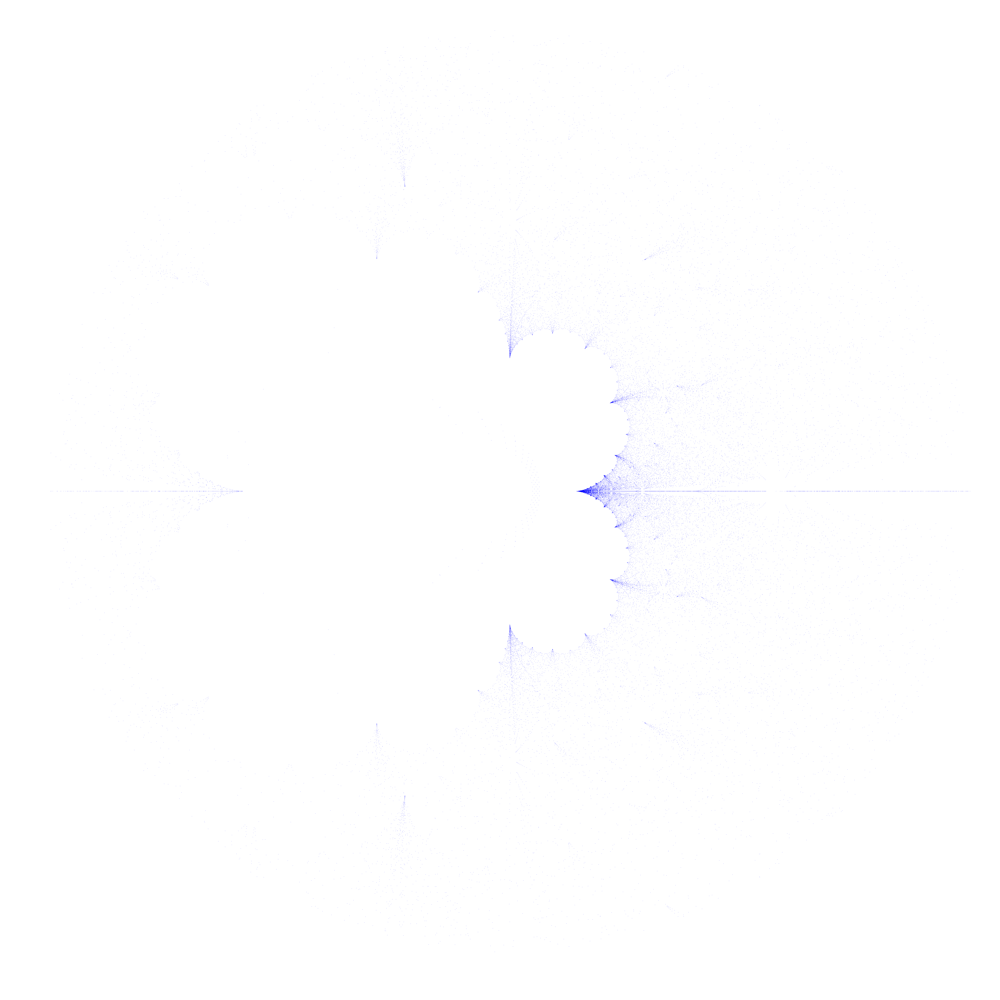

In [31]:
scatter([c1[j] for j in 1:length(c1)], mode="markers", markersize = 1,markerstrokewidth=0, c = :blue, size = (5000,5000), label=false, aspect_ratio=1, framestyle= :none)

In [35]:
Pkg.add("AMRVW")

   Resolving package versions...


  No Changes to `~/.julia/environment/v1.6/Project.toml`
  No Changes to `~/.julia/environment/v1.6/Manifest.toml`


In [50]:
c2=filter(z->abs2(z)<1/16, rootset);

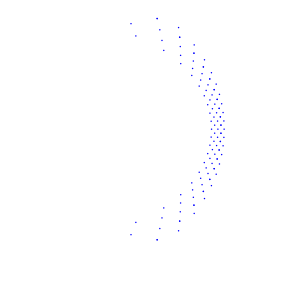

In [52]:
scatter([c2[j] for j in 1:length(c2)], mode="markers", markersize = 1,markerstrokewidth=0, c = :blue, size = (300,300), label=false, aspect_ratio=1, framestyle= :none)

In [49]:
for den in keys(RD)
    for num in keys(RD[den])
        for z in RD[den][num][2]
            if abs2(z)<1/16
                println(RD[den][num][1])
                println(z)
            end
        end
    end
end

[1, 98]
-0.02010176471432974661548808615655324130094663152394118011125534657262822852369308 + 0.203353106012871039299630982793608168338763904026286630179003572561074003134825im
[1, 98]
0.02176703295783070051916258811851942619258976824729897883206907435135073861233565 - 0.1690604835303207899032555473505336635240106550147059016796466229981487664519208im
[1, 98]
0.09811625718535188303468490751315211830281261223599413975619703519277878565207439 + 0.01657318748105512068407955045382372146166107320512638138292093077391468280824765im
[1, 98]
-0.02010176471432974661548808615655324130094663152394118011125534657262822852389846 - 0.2033531060128710392996309827936081683387639040262866301790035725610740031349243im
[1, 98]
0.02176703295783070051916258811851942619258976824729897883206907435135073861160967 + 0.1690604835303207899032555473505336635240106550147059016796466229981487664527175im
[1, 98]
0.08682605195966754063097333991717722187737975928938069920250662847223323999223555 - 0.070129541880087892

im
[1, 99]
0.0470016146755600073171681703484366669496030177312889086469627463742536949175492 + 0.1242337508294408915874458096293211471528549765326329723301283588760421592541953im
[1, 99]
0.09066377639445627655452964498384160141149503227038229365278092342472333305571287 - 0.0247439746255347897185165364478180965817699726908081927929165310904310491081957im
[1, 99]
-0.01566670961272015350766680254943830262482529784333809840478132467558643347009793 - 0.1815745311143426153458694578779377707337723348118284310293908982321760930707969im
[1, 99]
0.02242469810143842171359090275046621518415577753073193287874278972837409336342071 + 0.1510433241069012733479748280671798195506488682985680949903581068681796865696163im
[1, 99]
0.02242469810143842171359090275046621518415577753073193287874278972837409336314624 - 0.1510433241069012733479748280671798195506488682985680949903581068681796865697566im
[1, 99]
0.09214666898053556838885625987575486372756847679504194517440410773843623801360424 + 0.00818880864540925

im


In [57]:
for z in RD[97][1][2]
            if abs2(z)<1/16
                println(z)
                println("")
            end
end

-0.02561666880633353271322337247130777003926998490868217681287540714036431112565372 + 0.2265702307616999576682463253139572346875909118102627825563135561956345937259304im

-0.02561666880633353271322337247130777003926998490868217681287540714036431112578569 - 0.2265702307616999576682463253139572346875909118102627825563135561956345937258613im

0.1049696115644060789993813563334472646076474353199599121097855158506418903956243 + 0.008315352185892243515723644873911050856700608450825720036354903892112092308350411im

0.04980654289543946232505098262111961791328002986451607272982694491485301938662365 - 0.1555705298411102477328639968980968754777775726503429333306153459278227279856258im

0.02060125143040272969324176745773603682080350743978888186674102182652126844015873 + 0.1882778317222875901076752795345961897422838697817162696851422122306115641243146im

0.09114676336246023072387895516884626771363444736391555076255375380812131879086725 + 0.080830304883583511789567210015058310037999452129269803913038

In [80]:
for den in 95:105
    println(Q([1,den])((1/4)*sec(pi/den)^2))
end

6.548804705097064e-11
-9.94733267503425e-10
13399.93447204553
-53730.447946362496
215376.4181088773
-842891.0313151232
-900318.2378130319
3.5936434898678875e6
3.817373393912277e6
2.9131984822591445e6
-1.5104881825633917e7
